<a href="https://colab.research.google.com/github/gperbone/clustering/blob/main/customer_personality_analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# from sklearn.model_selection import GridSearchCV
# from sklearn.cluster import KMeans
# from sklearn.metrics import silhouette_score, make_scorer

# def scorer(estimator, X, y=None):
#     y_pred = estimator.fit_predict(X)
#     return silhouette_score(X, y_pred)

# model = KMeans()
# param_grid = {
#     'n_clusters': np.arange(2, 10),

# }

# gridCV = GridSearchCV(estimator = model,
#                       param_grid=param_grid,
#                       cv=2,
#                       scoring=scorer)
# gridCV.fit(df_scaled)
# # Print the best parameters and best score
# print("Best Parameters: ", gridCV.best_params_)
# print("Best Silhouette Score: ", gridCV.best_score_)

# Customer Personality Analysis

- Objetivo: entender os diferentes segmentos de consumidores do negócio;


In [ ]:
import zipfile

with zipfile.ZipFile('/content/customer_personality_analysis.zip', 'r') as zip_ref:
  zip_ref.extractall('/content/')

In [ ]:
pip install dataprep

In [ ]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.decomposition import PCA

from dataprep.eda import plot, plot_correlation, create_report, plot_missing

pd.set_option('display.max_columns', 50)

In [ ]:
df = pd.read_csv('marketing_campaign.csv', sep='\t')
df.head()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,21-08-2013,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,10-02-2014,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,19-01-2014,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,3,11,0


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 29 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   2240 non-null   int64  
 1   Year_Birth           2240 non-null   int64  
 2   Education            2240 non-null   object 
 3   Marital_Status       2240 non-null   object 
 4   Income               2216 non-null   float64
 5   Kidhome              2240 non-null   int64  
 6   Teenhome             2240 non-null   int64  
 7   Dt_Customer          2240 non-null   object 
 8   Recency              2240 non-null   int64  
 9   MntWines             2240 non-null   int64  
 10  MntFruits            2240 non-null   int64  
 11  MntMeatProducts      2240 non-null   int64  
 12  MntFishProducts      2240 non-null   int64  
 13  MntSweetProducts     2240 non-null   int64  
 14  MntGoldProds         2240 non-null   int64  
 15  NumDealsPurchases    2240 non-null   i

- The dataset conatins 2.240 rows and 29 columns (features).

- Based on the info available on [Kaggle](https://www.kaggle.com/datasets/imakash3011/customer-personality-analysis), we have the following:
  - **People**
    - ID: Customer's unique identifier
    - Year_Birth: Customer's birth year
    - Education: Customer's education level
    - Marital_Status: Customer's marital status
    - Income: Customer's yearly household income
    - Kidhome: Number of children in customer's household
    - Teenhome: Number of teenagers in customer's household
    - Dt_Customer: Date of customer's enrollment with the company
    - Recency: Number of days since customer's last purchase
    - Complain: 1 if the customer complained in the last 2 years, 0 otherwise

  - **Products**
    - MntWines: Amount spent on wine in the last 2 years
    - MntFruits: Amount spent on fruits in the last 2 years
    - MntMeatProducts: Amount spent on meat in the last 2 years
    - MntFishProducts: Amount spent on fish in the last 2 years
    - MntSweetProducts: Amount spent on sweets in the last 2 years
    - MntGoldProds: Amount spent on gold in the last 2 years

  - **Promotion**
    - NumDealsPurchases: Number of purchases made with a discount
    - AcceptedCmp1: 1 if customer accepted the offer in the 1st campaign, 0 otherwise
    - AcceptedCmp2: 1 if customer accepted the offer in the 2nd campaign, 0 otherwise
    - AcceptedCmp3: 1 if customer accepted the offer in the 3rd campaign, 0 otherwise
    - AcceptedCmp4: 1 if customer accepted the offer in the 4th campaign, 0 otherwise
    - AcceptedCmp5: 1 if customer accepted the offer in the 5th campaign, 0 otherwise
    - Response: 1 if customer accepted the offer in the last campaign, 0 otherwise

  - **Place**
    - NumWebPurchases: Number of purchases made through the company’s website
    - NumCatalogPurchases: Number of purchases made using a catalogue
    - NumStorePurchases: Number of purchases made directly in stores
    - NumWebVisitsMonth: Number of visits to the company’s website in the last month

- We can make use of dataprep library to quickly plot these features:



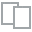
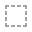
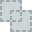
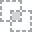
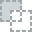
...
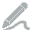
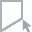
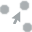
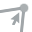
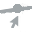

In [ ]:
plot(df)

Since there are a lot of features, we will make use of the division made in the description of the dataset to analyze the data in parts.

#People

In [ ]:
people_columns = ['ID', 'Year_Birth', 'Education', 'Marital_Status', 'Income',
                  'Kidhome', 'Teenhome', 'Dt_Customer', 'Recency', 'Complain']
people_df = df[people_columns]

In [ ]:
people_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 10 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   ID              2240 non-null   int64  
 1   Year_Birth      2240 non-null   int64  
 2   Education       2240 non-null   object 
 3   Marital_Status  2240 non-null   object 
 4   Income          2216 non-null   float64
 5   Kidhome         2240 non-null   int64  
 6   Teenhome        2240 non-null   int64  
 7   Dt_Customer     2240 non-null   object 
 8   Recency         2240 non-null   int64  
 9   Complain        2240 non-null   int64  
dtypes: float64(1), int64(6), object(3)
memory usage: 175.1+ KB


In [ ]:
print(f"Porcentagem de valores nulos: {(people_df['Income'].isna().sum() / people_df['Income'].count()) * 100}%")

Porcentagem de valores nulos: 1.083032490974729%


There are null values in the *Income* columns. These, however, represent only a small fraction and will be dropped.

Also, the column *Dt_Customer* is in the object format and needs to be transformed to datetime.

In [ ]:
people_df = people_df.dropna()
people_df["Dt_Customer"] = pd.to_datetime(people_df["Dt_Customer"], format="%d-%m-%Y")

<ipython-input-381-40cd4120e8f7>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  people_df["Dt_Customer"] = pd.to_datetime(people_df["Dt_Customer"], format="%d-%m-%Y")


Ok, we are ready to plot our features.

In [ ]:
def plot_features(df, feature, numerical=None):
  if numerical != False and pd.api.types.is_numeric_dtype(df[feature].dtype): #numerical feature
    fig, axes = plt.subplots(1,2, figsize=(12,8))

    sns.boxplot(data=df, y=feature, color='green', ax=axes[0])
    plt.ylabel(feature)
    sns.histplot(data=df, y=feature, color='blue', ax=axes[1], stat='density', kde=True)
    plt.ylabel(None)
    plt.show()

  else: #categorical
    fig, ax = plt.subplots(figsize=(12,8))
    sns.countplot(data=df, x=feature, ax=ax)
    for p in ax.patches:
        ax.annotate(f'\n{p.get_height()}',
                   (p.get_x()+0.4, p.get_height()+5),
                   ha = "center", color = "black")
    plt.xlabel("\n" + feature)
    plt.ylabel("Number of Clients")
    plt.show()


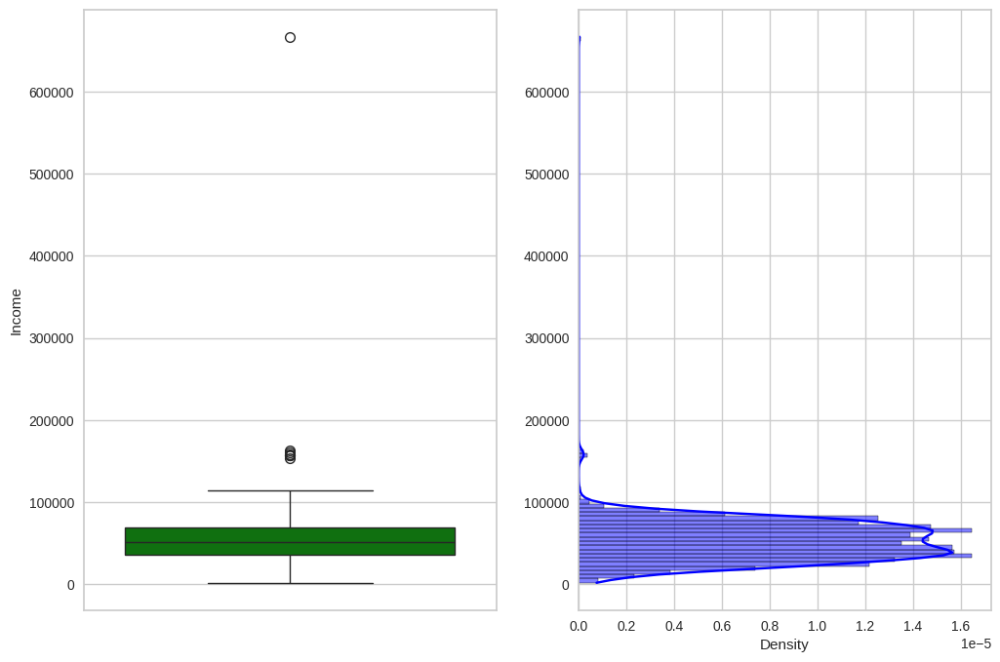

In [ ]:
plot_features(people_df, 'Income')

<ipython-input-384-18a698f7b7e5>:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  people_df = people_df[df.Income<200000]


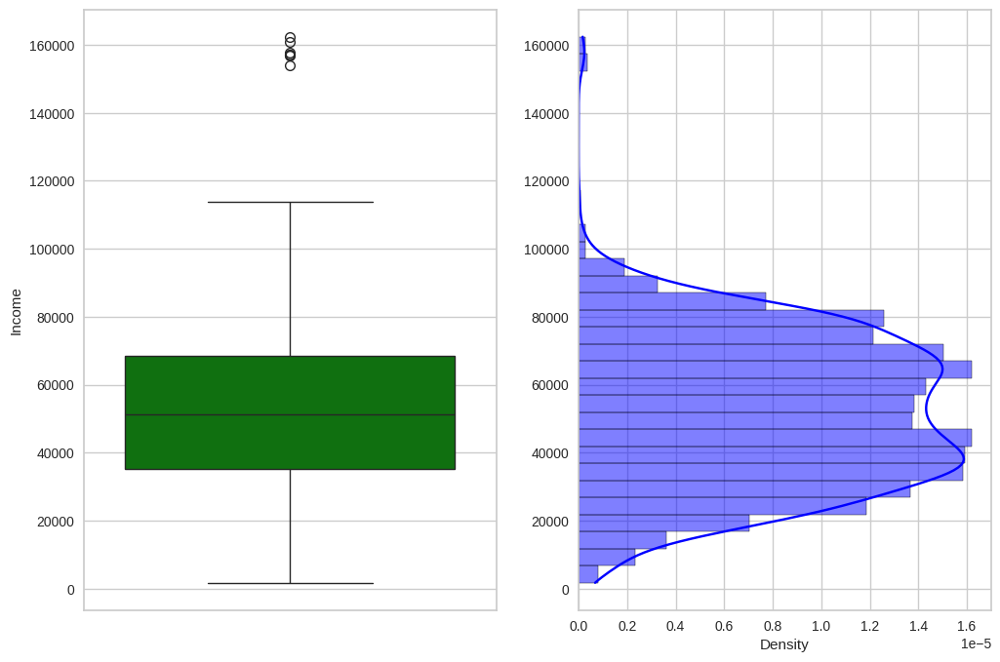

In [ ]:
people_df = people_df[df.Income<200000]

plot_features(people_df, 'Income')

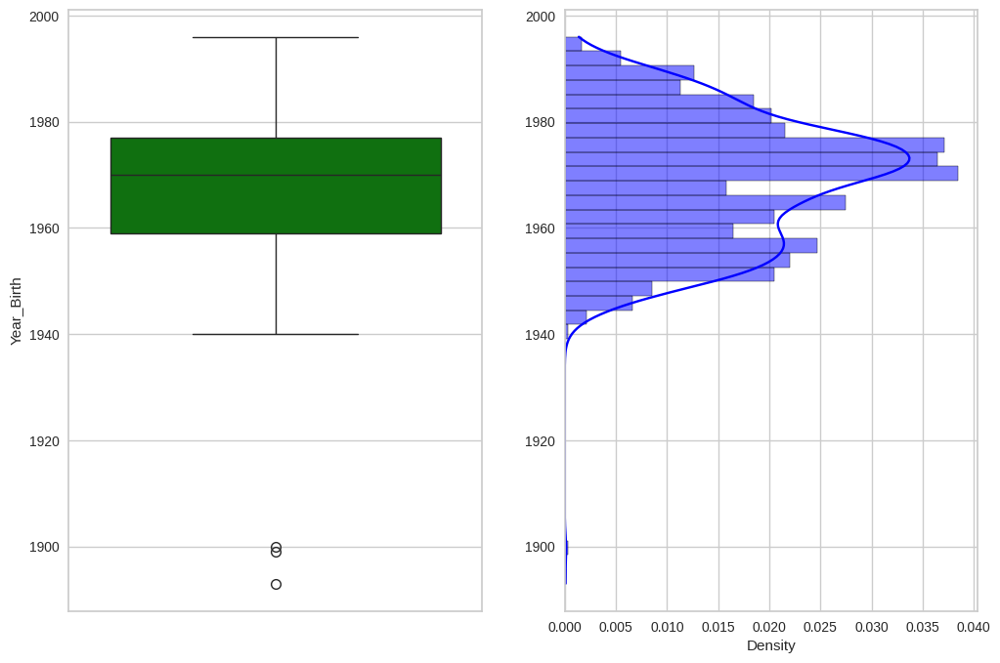

In [ ]:
plot_features(people_df, 'Year_Birth')

We clearly got some outliers, but we will turn this feature into *Age* and then check it again (using the most recent customer registration date as the reference date for today).

In [ ]:
people_df['Age'] = people_df.Dt_Customer.max().year - people_df.Year_Birth
people_df = people_df.drop(['Year_Birth'], axis=1)


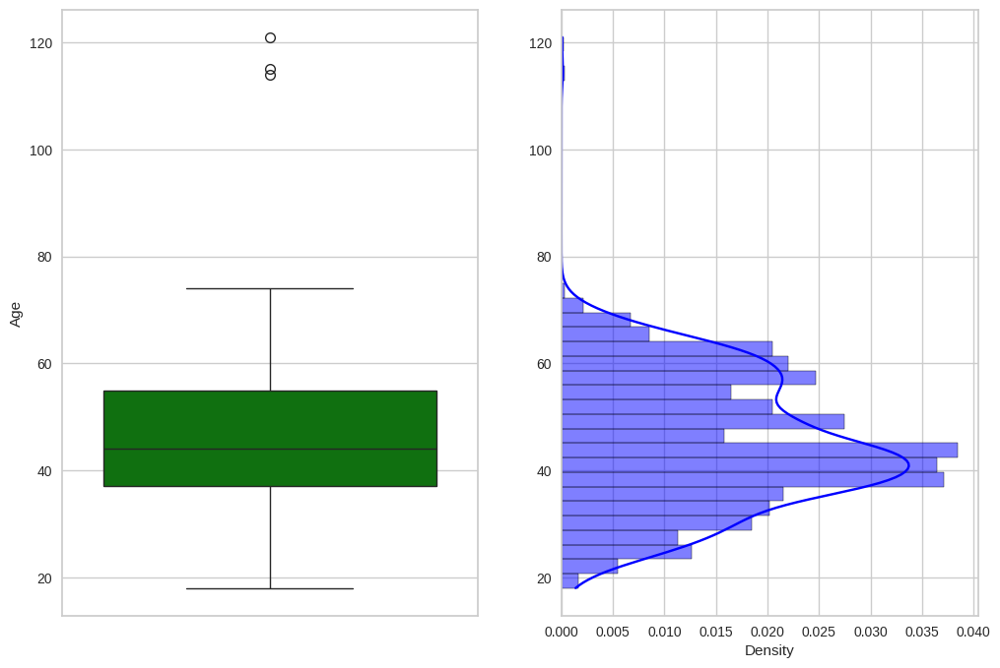

In [ ]:
plot_features(people_df, 'Age')

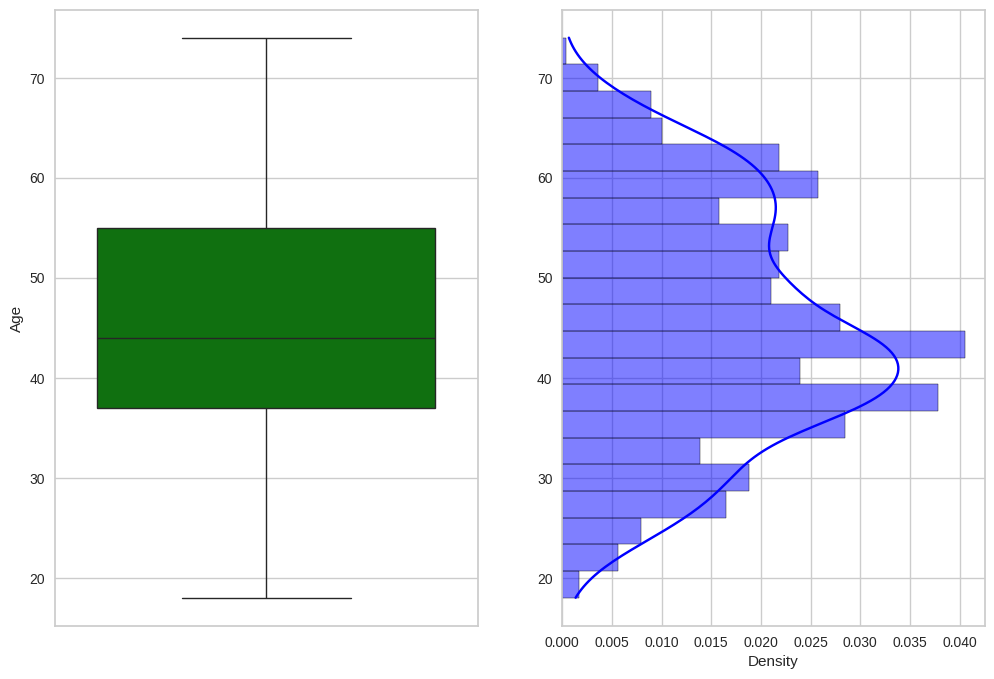

In [ ]:
people_df = people_df[people_df['Age'] < 80]

plot_features(people_df, 'Age')

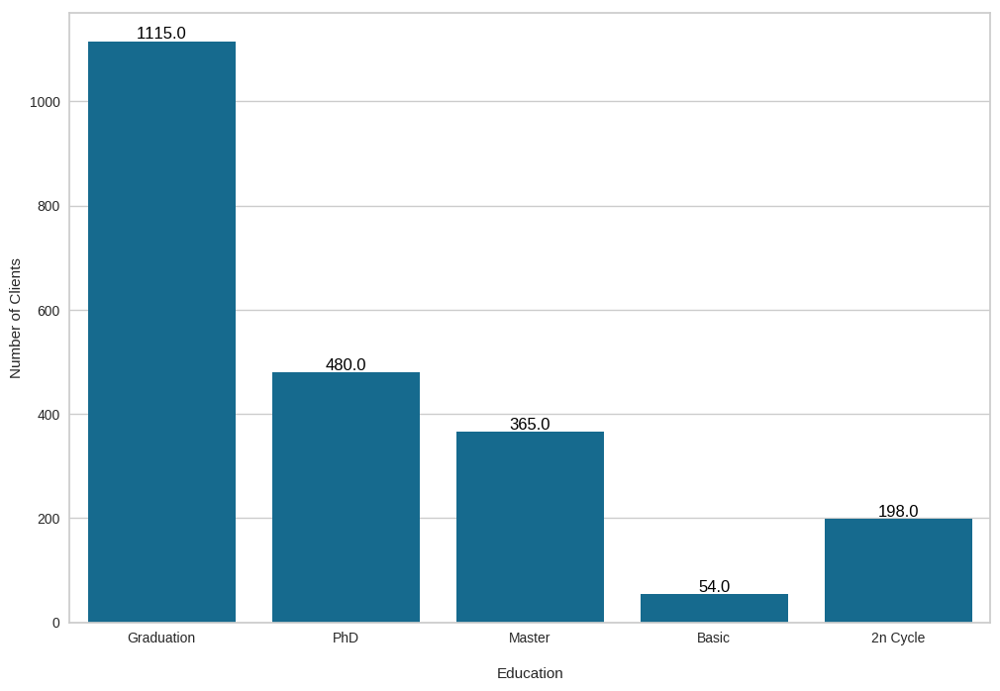

In [ ]:
plot_features(people_df, 'Education')

To go through the model, this would have to be encoded. We can use LabelEncoder, OneHotEnconder or do it by hand, which is what I will do:

In [ ]:
people_df['Education'] = people_df['Education'].replace({'Basic':0,'2n Cycle':1,'Graduation':2,'Master':3,'PhD':4})

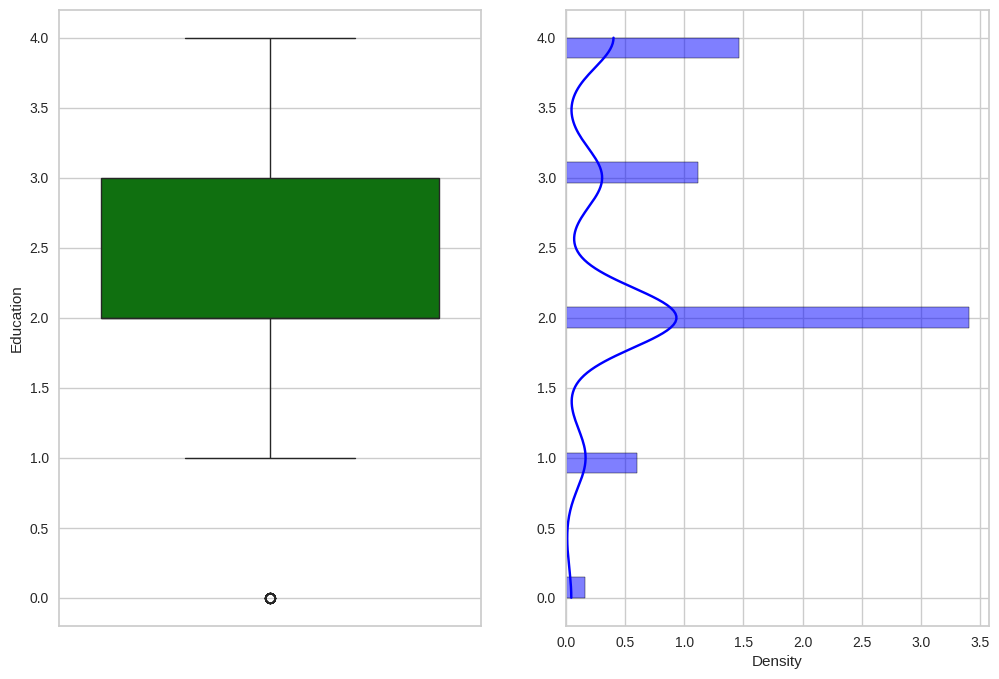

In [ ]:
plot_features(people_df, 'Education')

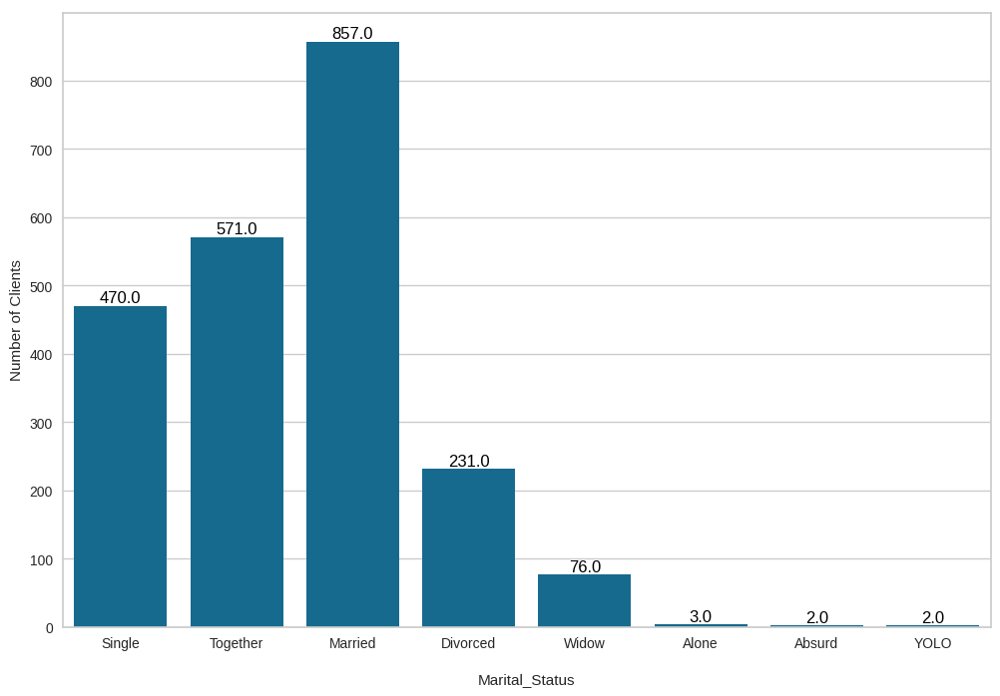

In [ ]:
plot_features(people_df, 'Marital_Status')

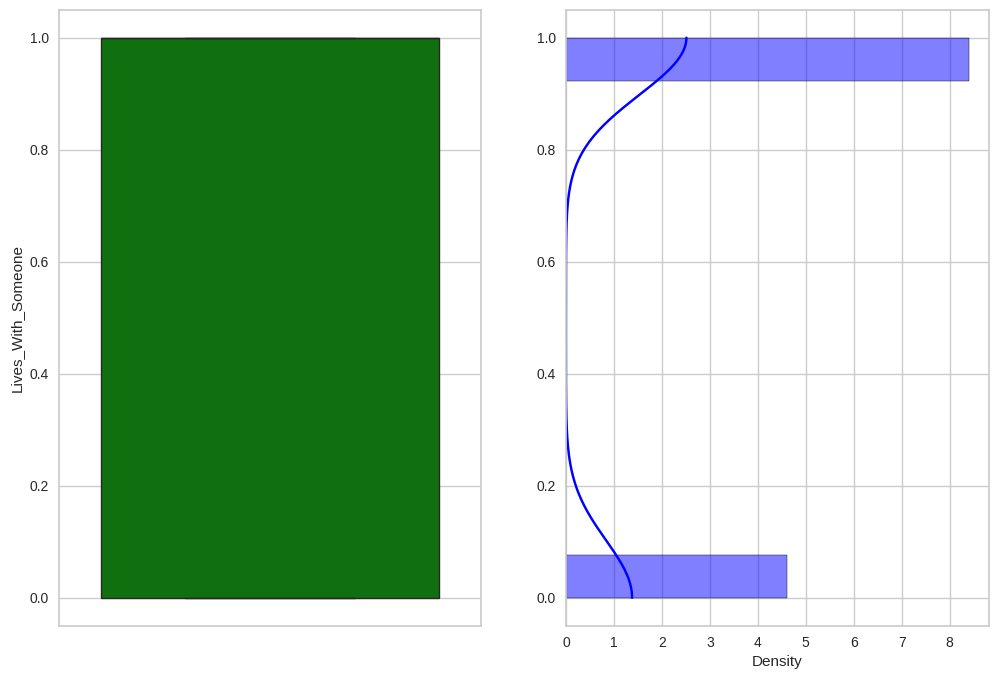

In [ ]:
people_df['Marital_Status'] = people_df['Marital_Status'].replace({'Alone':'Single','Absurd':'Single','YOLO':'Single'})
people_df['Lives_With_Someone'] = people_df['Marital_Status'].replace({'Single':0, 'Together':1, 'Married':1, 'Divorced':0, 'Widow':0})

plot_features(people_df, 'Lives_With_Someone')

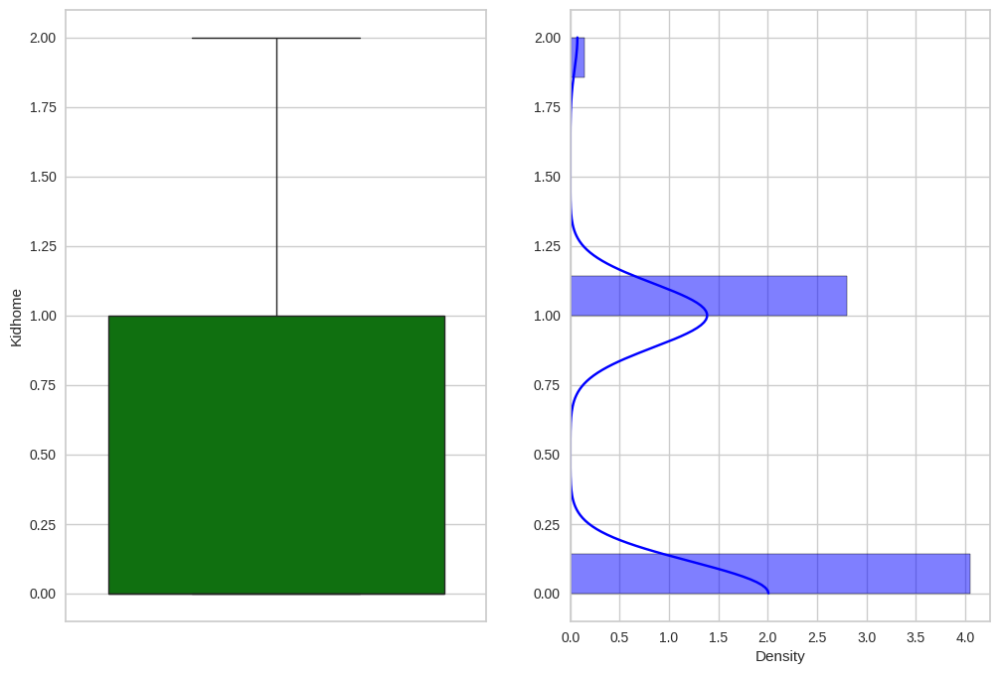

In [ ]:
plot_features(people_df, 'Kidhome')

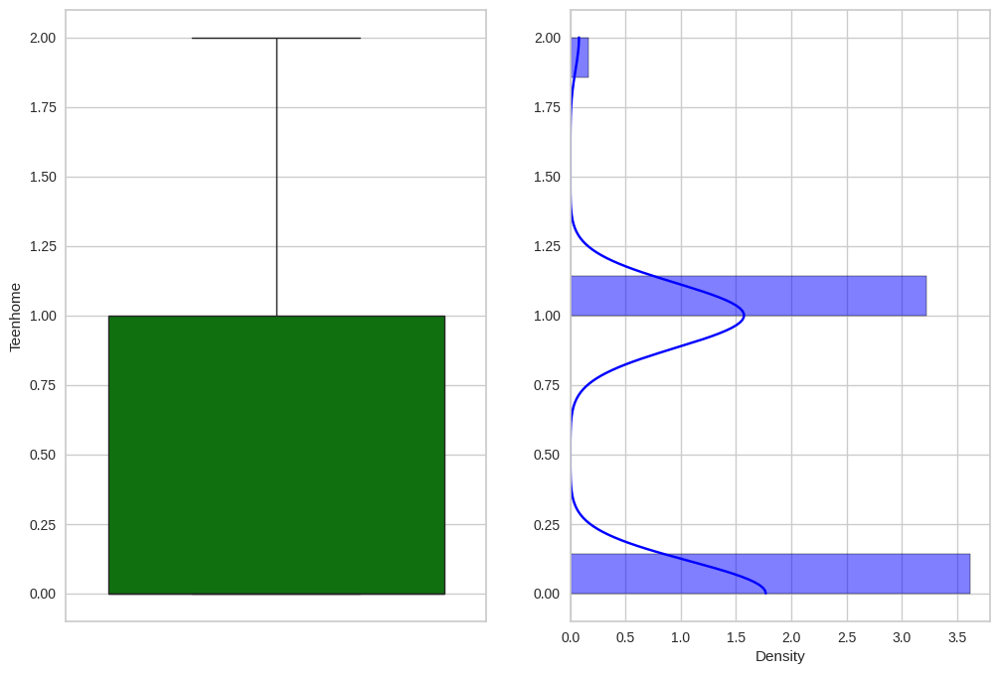

In [ ]:
plot_features(people_df, 'Teenhome')

In [ ]:
people_df['Dt_Customer'].describe()

<ipython-input-396-ae8359e13536>:1: FutureWarning: Treating datetime data as categorical rather than numeric in `.describe` is deprecated and will be removed in a future version of pandas. Specify `datetime_is_numeric=True` to silence this warning and adopt the future behavior now.
  people_df['Dt_Customer'].describe()


count                    2212
unique                    662
top       2012-08-31 00:00:00
freq                       12
first     2012-07-30 00:00:00
last      2014-06-29 00:00:00
Name: Dt_Customer, dtype: object

In [ ]:
# Let´s turn this to numeric data:
people_df['Dt_Customer'] = (people_df.Dt_Customer.max()-people_df.Dt_Customer).dt.days

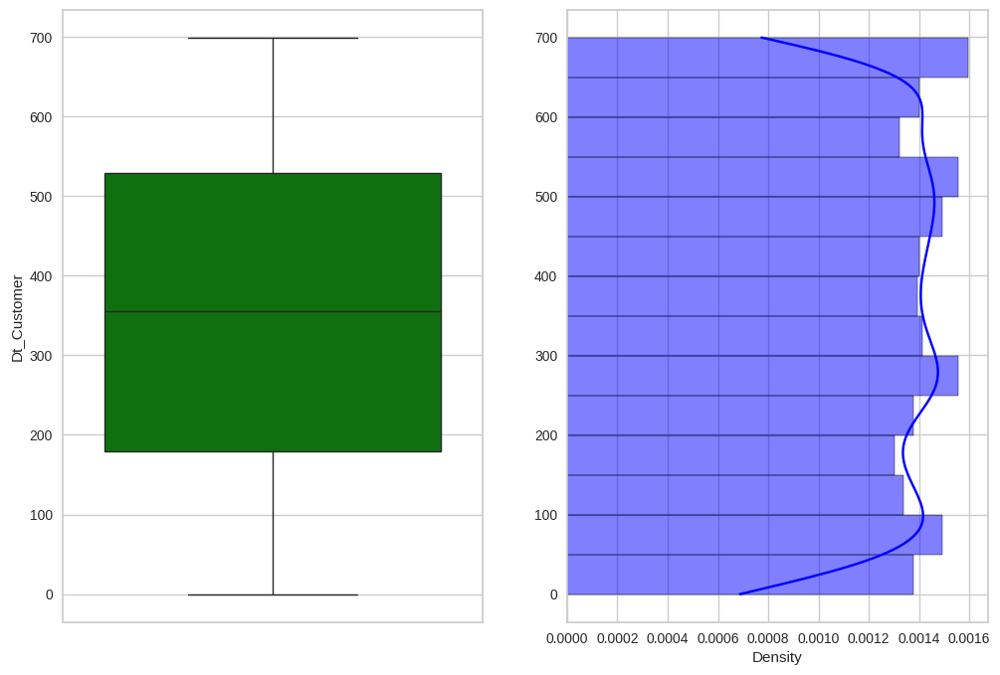

In [ ]:
plot_features(people_df, 'Dt_Customer')

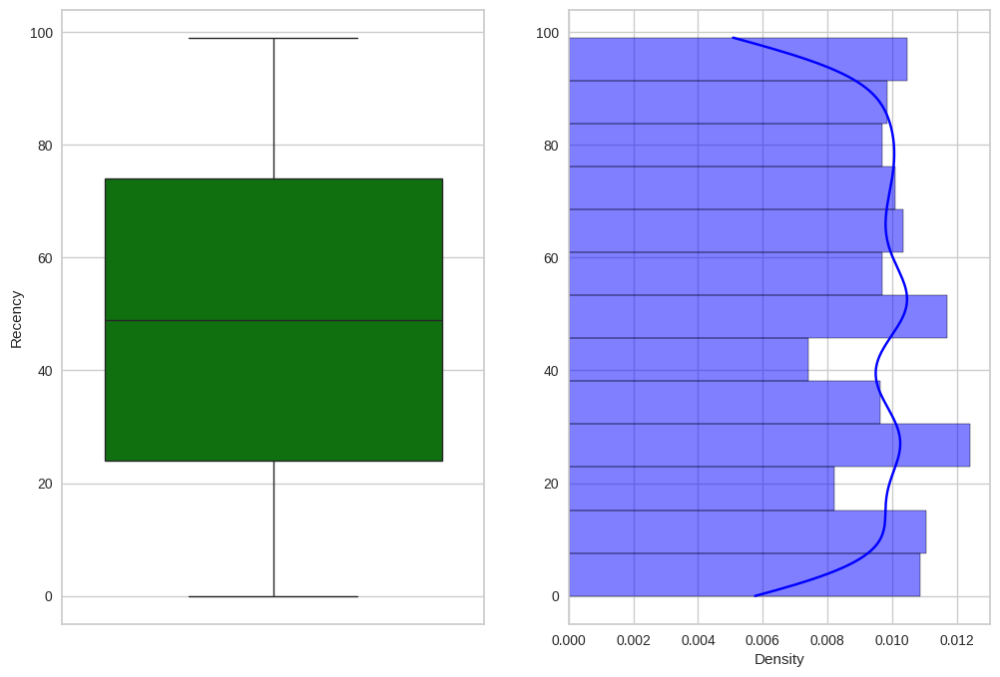

In [ ]:
plot_features(people_df, 'Recency')

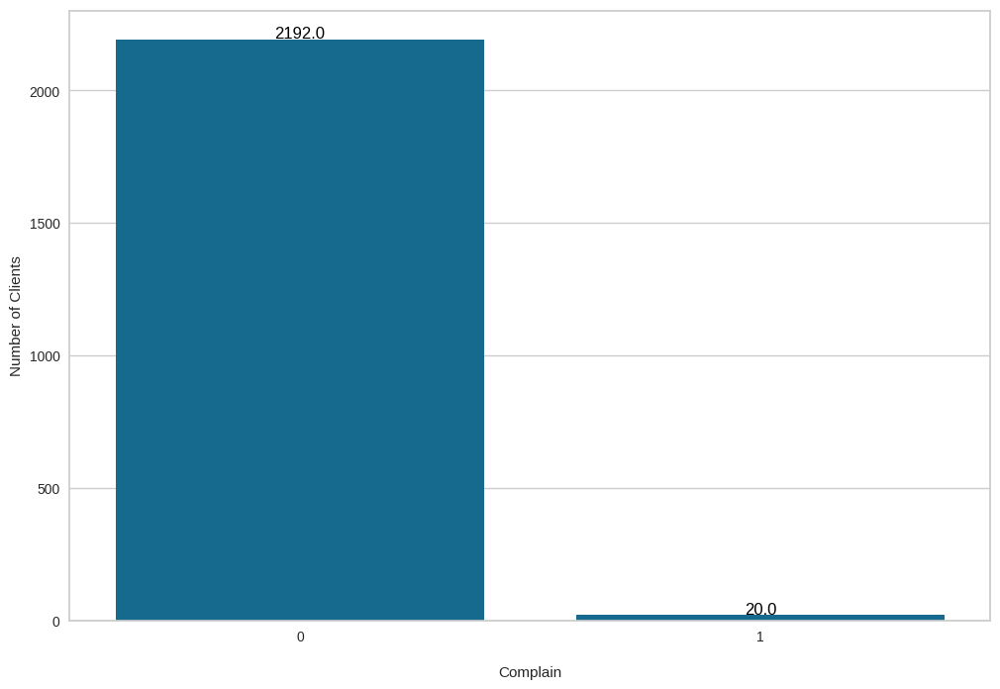

In [ ]:
plot_features(people_df, 'Complain', numerical=False)

Since only 20 clients have complains, this column doesn't seem important and will be dropped.

In [ ]:
people_df = people_df.drop(['Complain'], axis=1)

# Products

In [ ]:
products_columns = ['ID', 'MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts',
                    'MntSweetProducts', 'MntGoldProds']
products_df = df[products_columns]

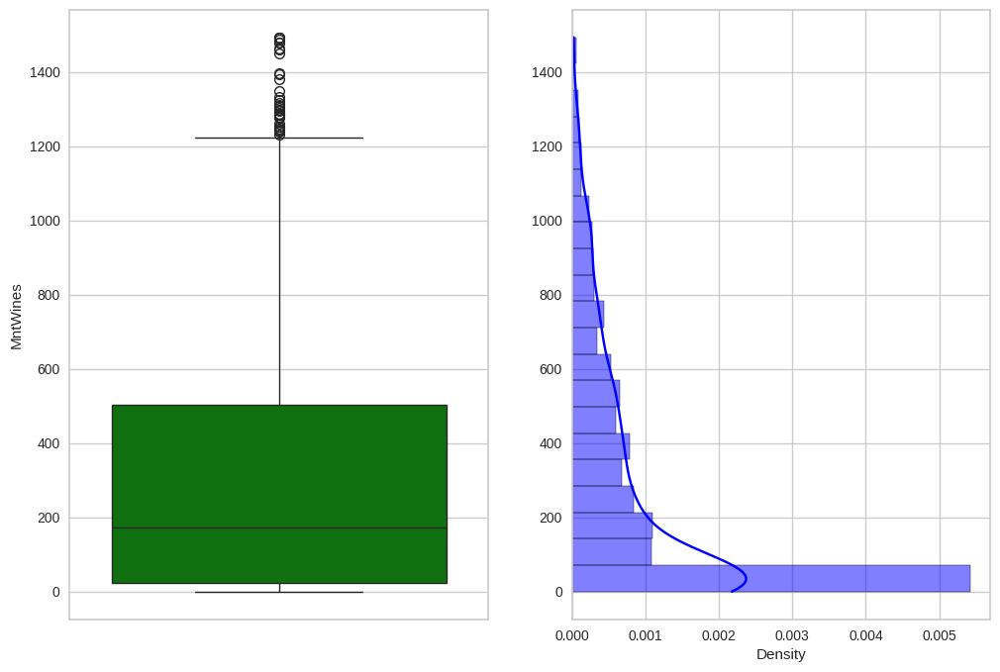

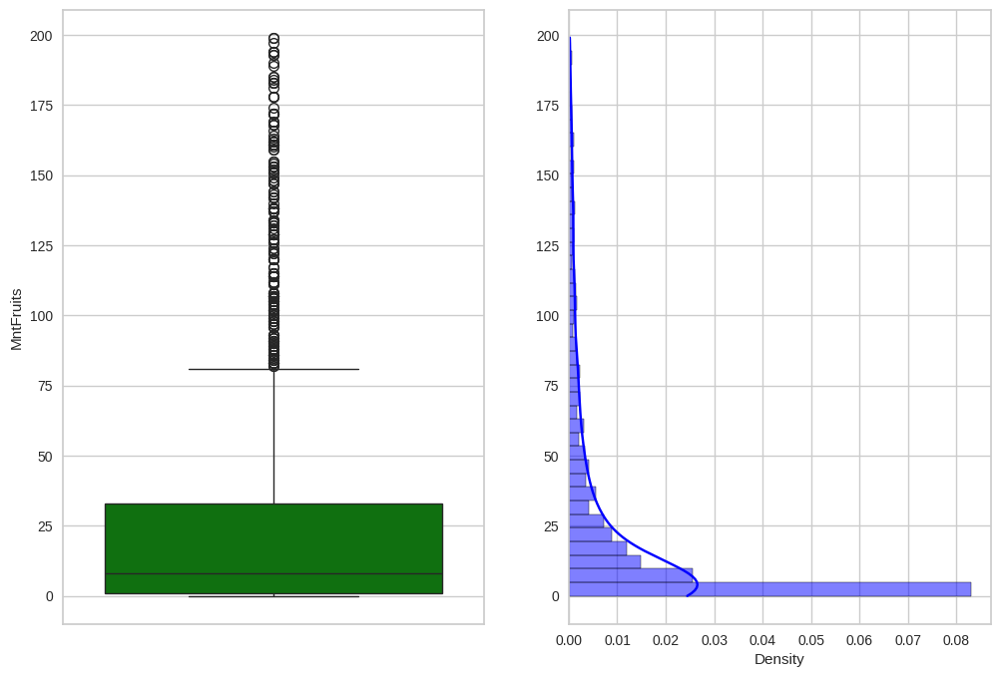

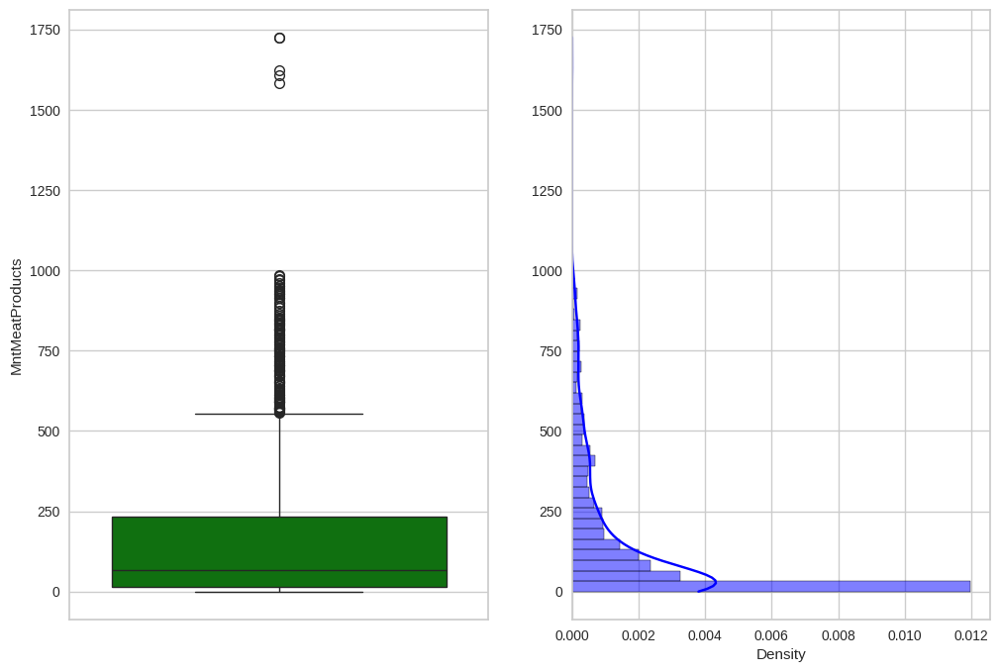

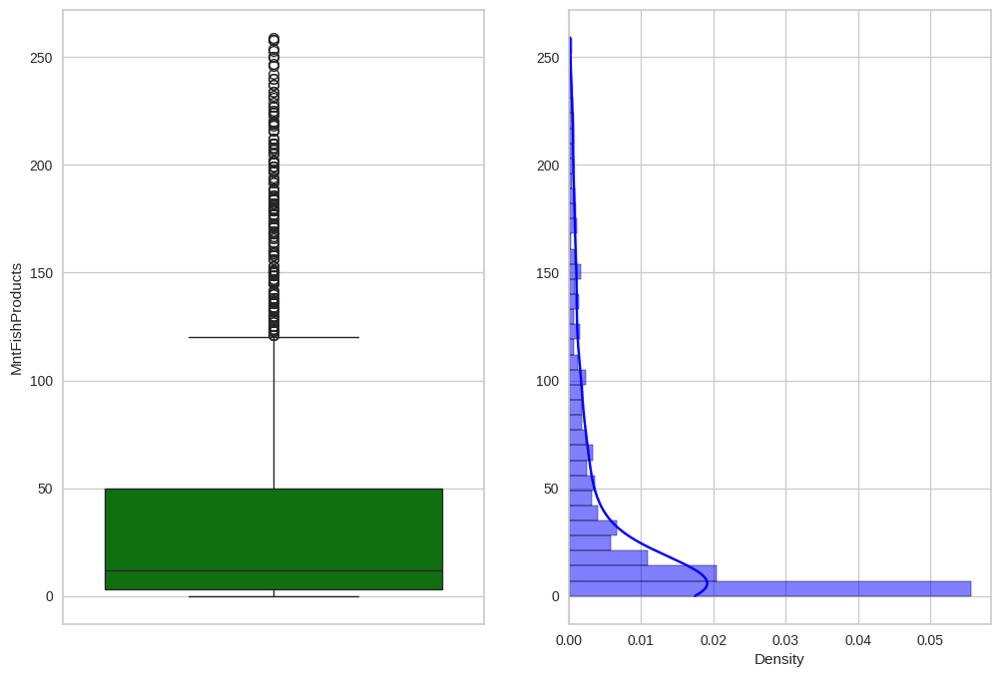

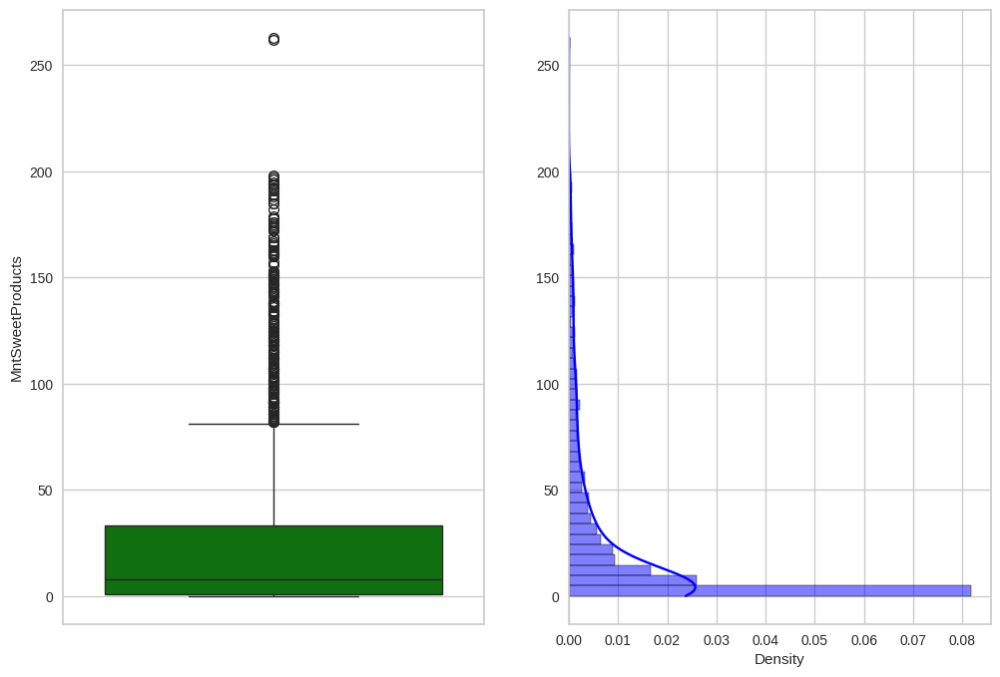

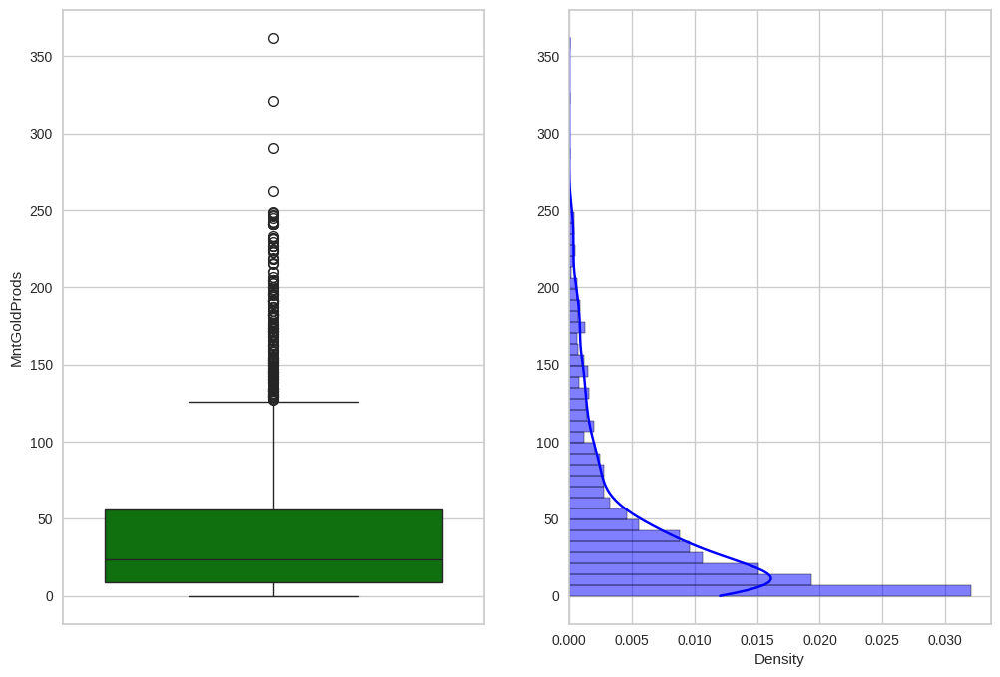

In [ ]:
for prod in ['MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts',
              'MntSweetProducts', 'MntGoldProds']:
  plot_features(products_df, prod)

Here, it is interesting to create a column representing the Total spent.

In [ ]:
products_df['Total_Spent'] = products_df['MntWines'] + products_df['MntFruits'] + products_df['MntMeatProducts'] + products_df['MntFishProducts'] + products_df['MntSweetProducts'] + products_df['MntGoldProds']


<ipython-input-404-d661c420471d>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  products_df['Total_Spent'] = products_df['MntWines'] + products_df['MntFruits'] + products_df['MntMeatProducts'] + products_df['MntFishProducts'] + products_df['MntSweetProducts'] + products_df['MntGoldProds']


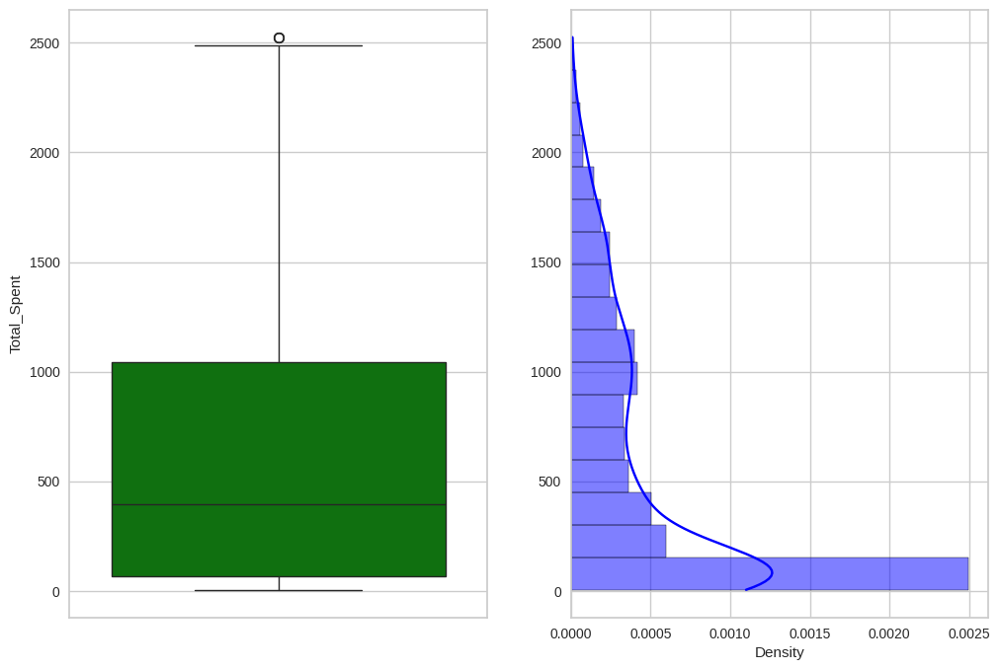

In [ ]:
plot_features(products_df, 'Total_Spent')

# Promotion

In [ ]:
promotion_columns = ['ID', 'NumDealsPurchases', 'AcceptedCmp1', 'AcceptedCmp2',
                     'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'Response']
promotion_df = df[promotion_columns]

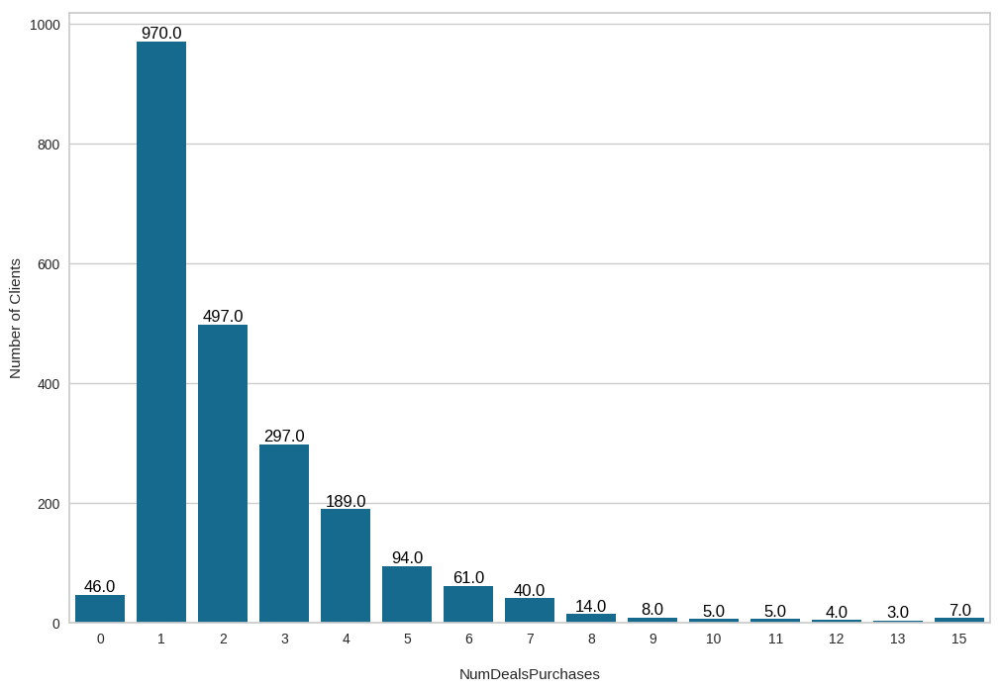

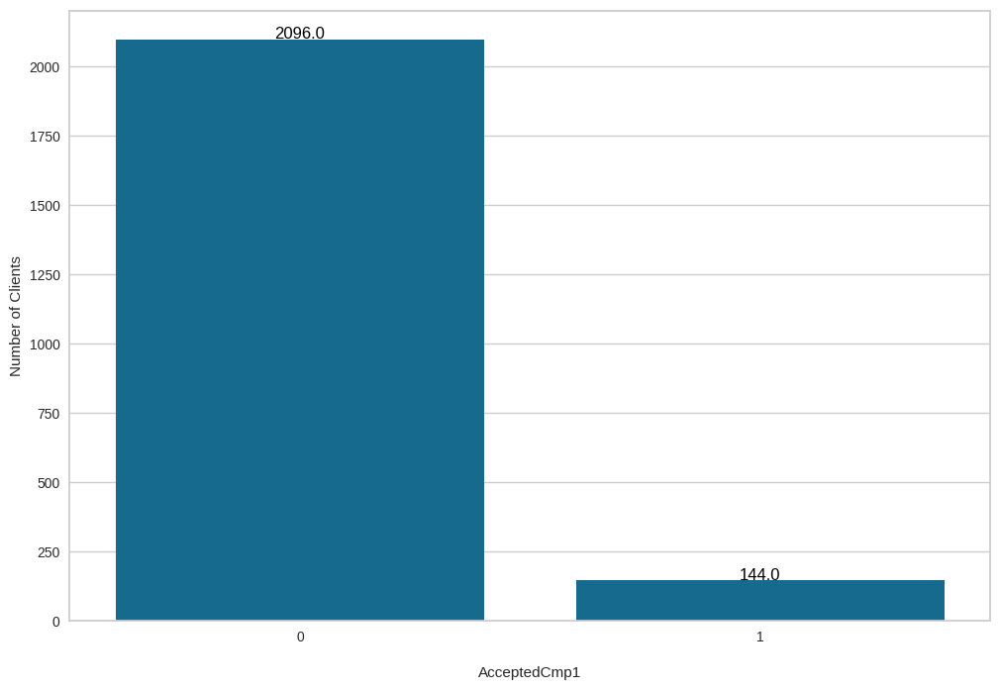

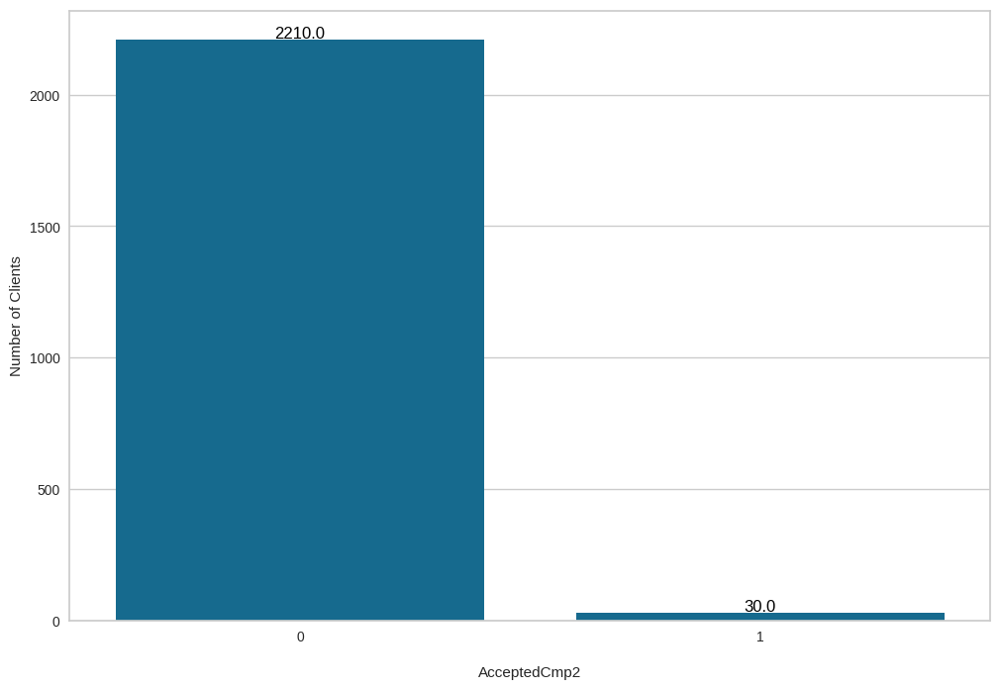

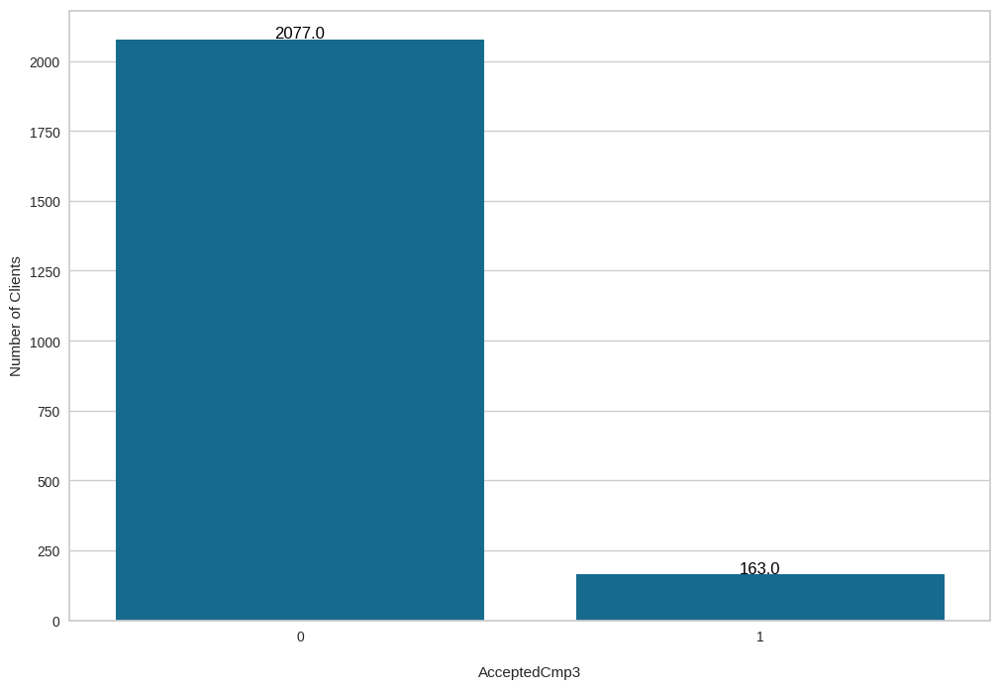

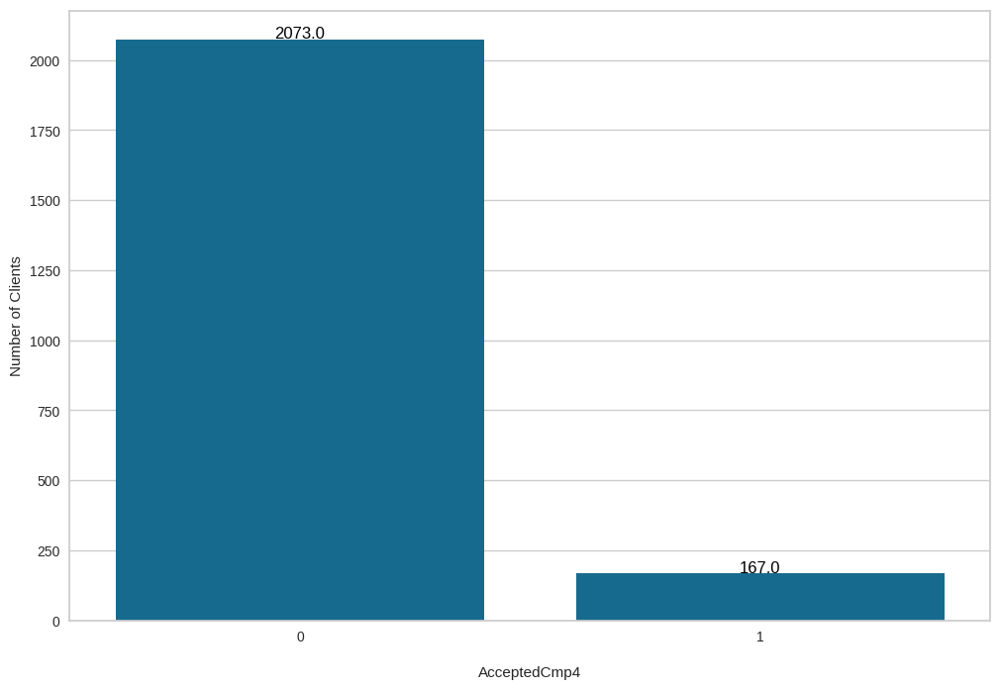

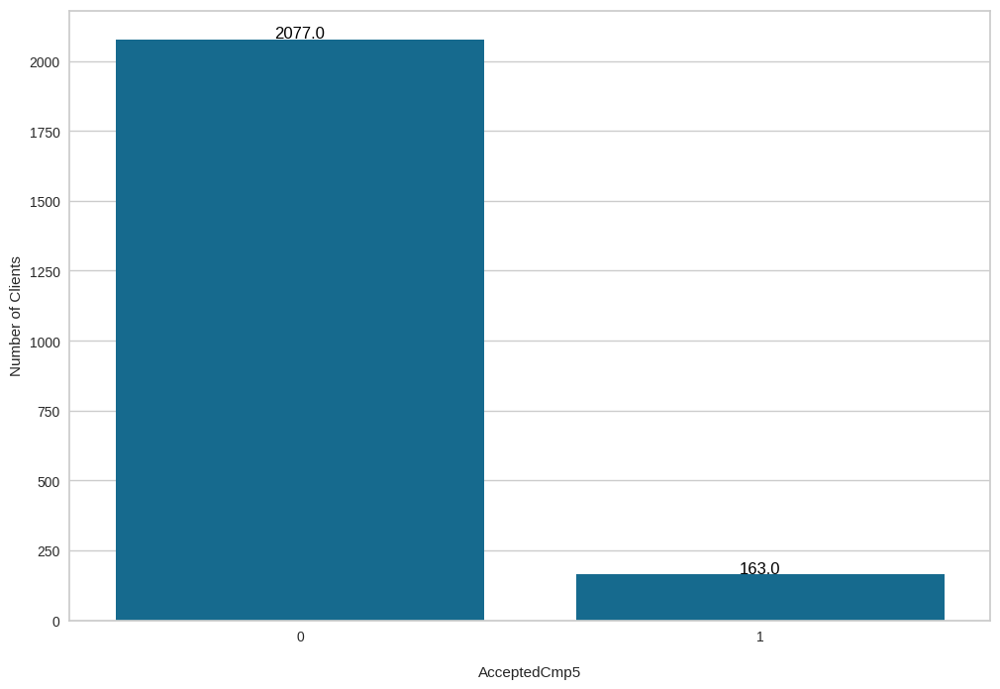

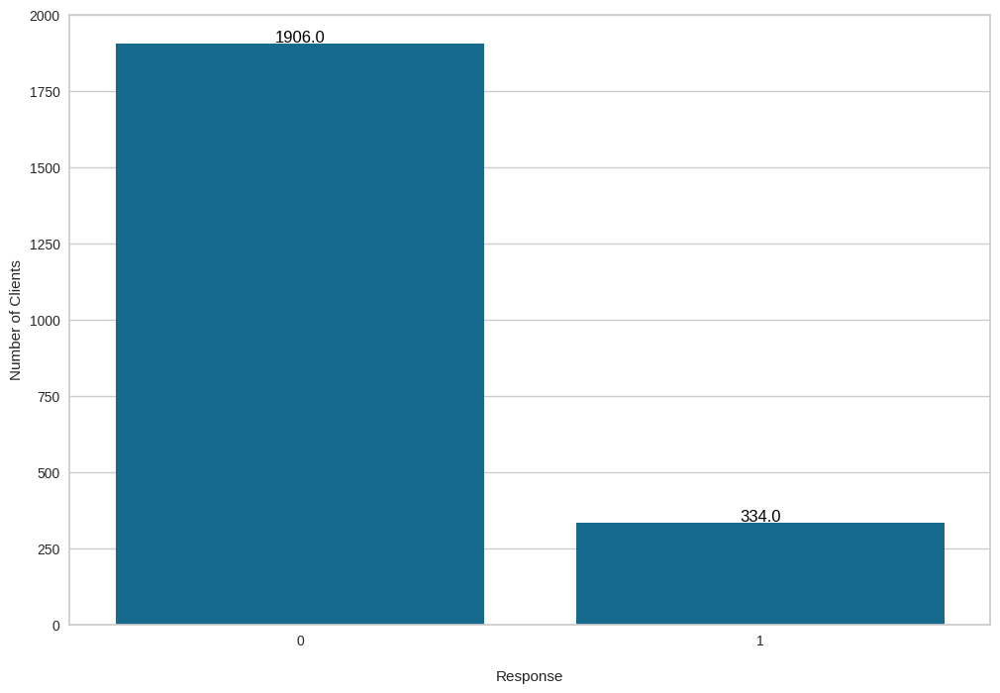

In [ ]:
plot_features(promotion_df, 'NumDealsPurchases', numerical=False)

for promotion in ['AcceptedCmp1', 'AcceptedCmp2', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'Response']:
  plot_features(promotion_df, promotion, numerical=False)

Since we don´t have any context on what each of the campaigns mean, we will summarize all of them in a single column, and then drop the individual campaings.

In [ ]:
promotion_df['Accepted_Campaigns'] = promotion_df['AcceptedCmp1'] + promotion_df['AcceptedCmp2'] + promotion_df['AcceptedCmp3'] + promotion_df['AcceptedCmp4'] + promotion_df['AcceptedCmp5'] + promotion_df['Response']

promotion_df = promotion_df.drop(['AcceptedCmp1', 'AcceptedCmp2','AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'Response'], axis=1)

<ipython-input-408-8d8c657d884c>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  promotion_df['Accepted_Campaigns'] = promotion_df['AcceptedCmp1'] + promotion_df['AcceptedCmp2'] + promotion_df['AcceptedCmp3'] + promotion_df['AcceptedCmp4'] + promotion_df['AcceptedCmp5'] + promotion_df['Response']


#Place

In [ ]:
place_columns = ['ID', 'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases',
                 'NumWebVisitsMonth']
place_df = df[place_columns]

In [ ]:
place_df.describe()

,ID,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth
count,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000
mean,5592.159821,4.084821,2.662054,5.790179,5.316518
std,3246.662198,2.778714,2.923101,3.250958,2.426645
min,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2828.250000,2.000000,0.000000,3.000000,3.000000
50%,5458.500000,4.000000,2.000000,5.000000,6.000000
75%,8427.750000,6.000000,4.000000,8.000000,7.000000
max,11191.000000,27.000000,28.000000,13.000000,20.000000


In [ ]:
place_df['Number_Purchases'] = place_df['NumWebPurchases'] + place_df['NumCatalogPurchases'] + place_df['NumStorePurchases']

place_df = place_df[place_df['Number_Purchases'] > 0]

<ipython-input-458-84220c0e2583>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  place_df['Number_Purchases'] = place_df['NumWebPurchases'] + place_df['NumCatalogPurchases'] + place_df['NumStorePurchases']


In [ ]:
for col in ['NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases']:
  place_df[col] = place_df[col] / place_df['Number_Purchases']

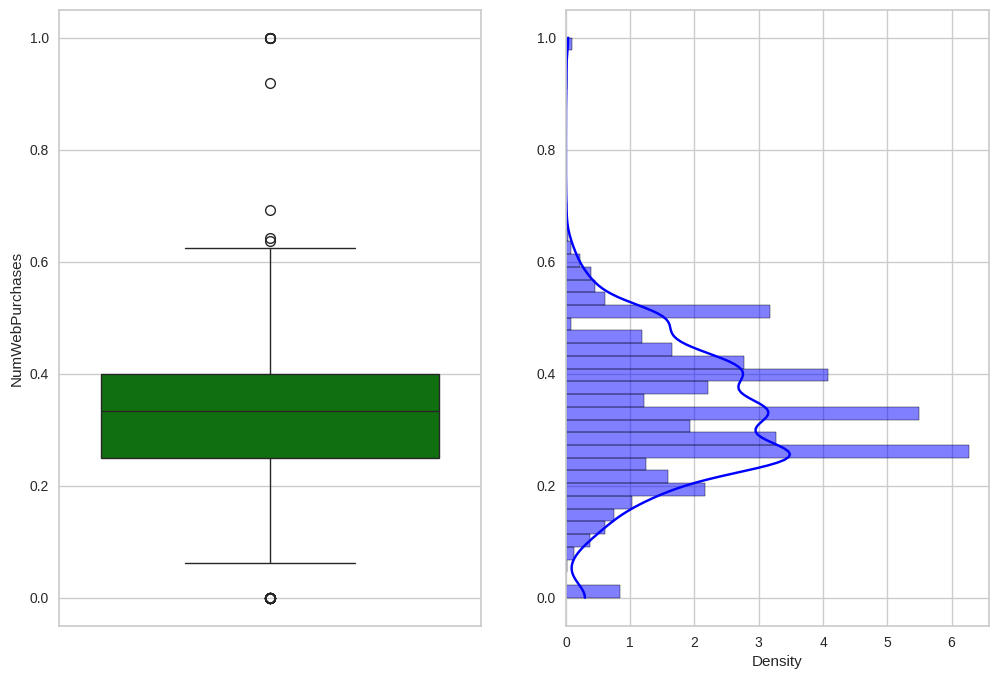

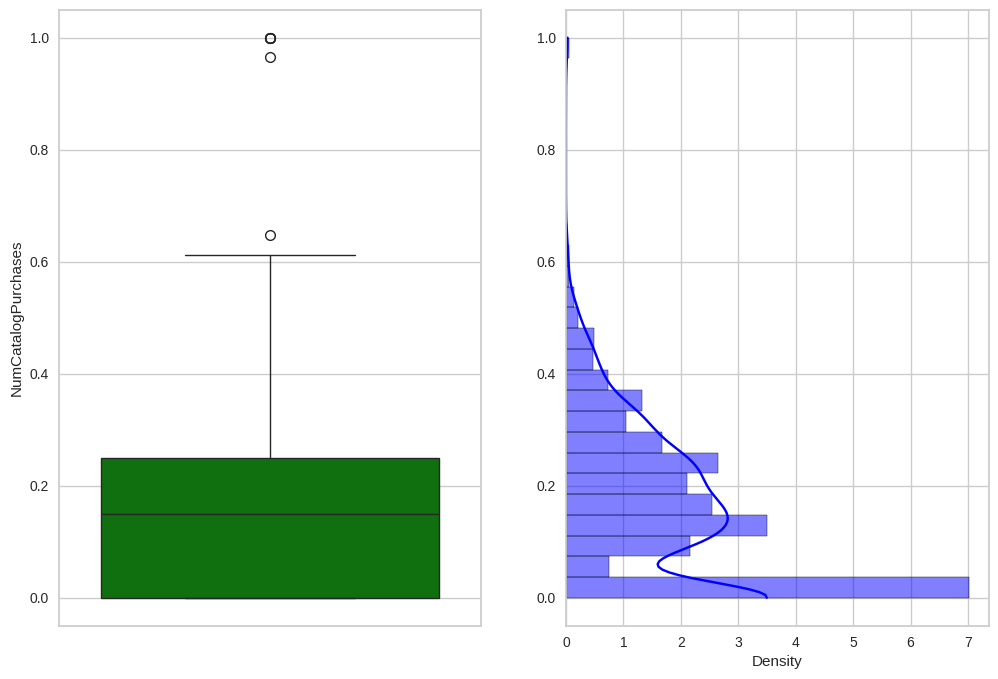

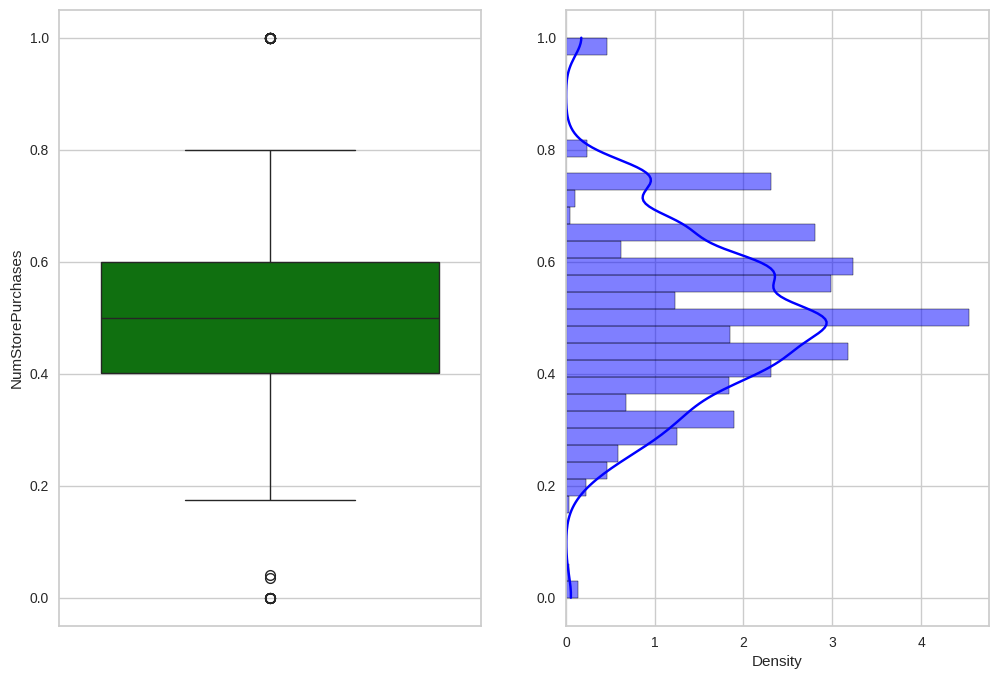

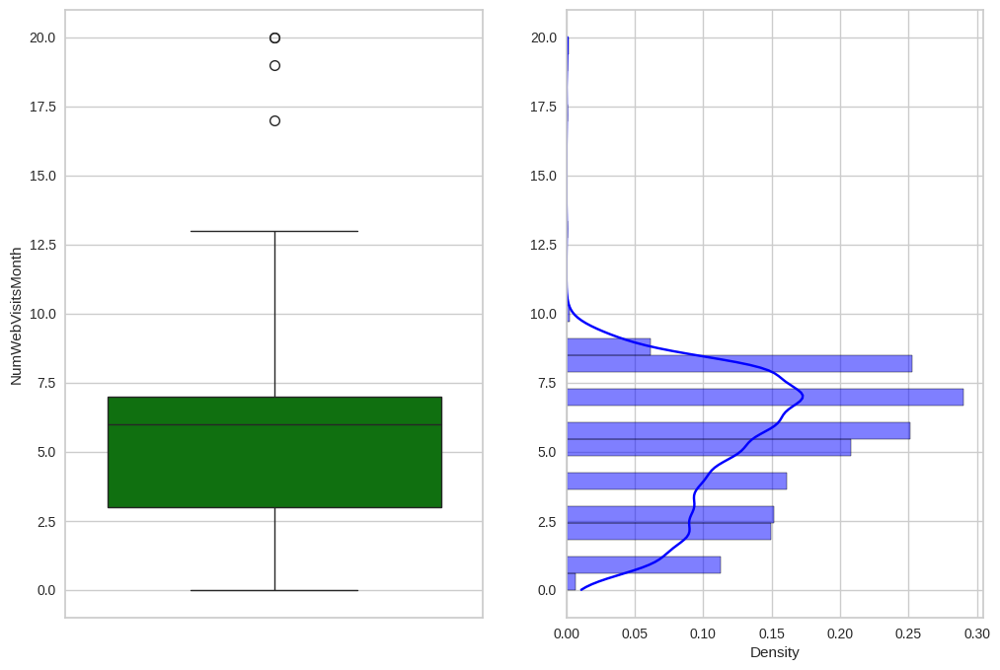

In [ ]:
for promotion in ['NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth']:
  plot_features(place_df, promotion)

# Joining all Dataframes

In [ ]:
df_final = people_df.merge(products_df, on='ID', how='inner')
df_final = df_final.merge(promotion_df, on='ID', how='inner')
df_final = df_final.merge(place_df, on='ID', how='inner')

In [ ]:
 df_final.head()

,ID,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,Age,Lives_With_Someone,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,Total_Spent,NumDealsPurchases,Accepted_Campaigns,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,Number_Purchases
0,5524,2,Single,58138.0,0,0,663,58,57,0,635,88,546,172,88,88,1617,3,1,0.363636,0.454545,0.181818,7,22
1,2174,2,Single,46344.0,1,1,113,38,60,0,11,1,6,2,1,6,27,2,0,0.250000,0.250000,0.500000,5,4
2,4141,2,Together,71613.0,0,0,312,26,49,1,426,49,127,111,21,42,776,1,0,0.400000,0.100000,0.500000,4,20
3,6182,2,Together,26646.0,1,0,139,26,30,1,11,4,20,10,3,5,53,2,0,0.333333,0.000000,0.666667,6,6
4,5324,4,Married,58293.0,1,0,161,94,33,1,173,43,118,46,27,15,422,5,0,0.357143,0.214286,0.428571,5,14


In [ ]:
print(df_final.shape)
print(df_final.columns)

(2206, 24)
Index(['ID', 'Education', 'Marital_Status', 'Income', 'Kidhome', 'Teenhome',
       'Dt_Customer', 'Recency', 'Age', 'Lives_With_Someone', 'MntWines',
       'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds', 'Total_Spent', 'NumDealsPurchases',
       'Accepted_Campaigns', 'NumWebPurchases', 'NumCatalogPurchases',
       'NumStorePurchases', 'NumWebVisitsMonth', 'Number_Purchases'],
      dtype='object')


Assim, ficamos com 2.206 ocorrências e 24 colunas.



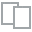
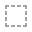
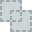
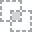
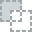
...
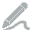
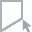
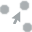
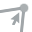
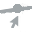

In [ ]:
from dataprep.eda import plot, plot_correlation, create_report, plot_missing
plot(df_final)

#Feature Engineering

In [ ]:
# devidir se vou calcular ticket medio
# df['Avg_Ticket'] = df['Total_Spent']/df['Number_Purchases']

# # Caso o indivíduo tenha um "Total_spent" mas o "Number_purchases" seja zero, isso representa um erro nos dados e o Avg_Ticket será infinito. Esses clientes serão excluídos da base
# df = df[df.Avg_Ticket < np.inf]

# Encoding

Clustering algorithms are sensitive to the scale of the data, as they are closely tied to distance measures. Therefore, numerical features will be scaled using the Standard Scaler.

Categorical variables need to be transformed into numerical ones to go through the algorithm. Therefore, we will use OneHot Encoding for *'Marital_Status'*.

In [ ]:
ohe = OneHotEncoder(sparse=False)

marital_ohe = pd.DataFrame(ohe.fit_transform(df_final[['Marital_Status']]), columns=ohe.get_feature_names_out())

/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


In [ ]:
df_final = pd.concat([df_final.reset_index(drop=True), marital_ohe], axis=1)

In [ ]:
df_final.columns

Index(['ID', 'Education', 'Marital_Status', 'Income', 'Kidhome', 'Teenhome',
       'Dt_Customer', 'Recency', 'Age', 'Lives_With_Someone', 'MntWines',
       'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds', 'Total_Spent', 'NumDealsPurchases',
       'Accepted_Campaigns', 'NumWebPurchases', 'NumCatalogPurchases',
       'NumStorePurchases', 'NumWebVisitsMonth', 'Number_Purchases',
       'Marital_Status_Divorced', 'Marital_Status_Married',
       'Marital_Status_Single', 'Marital_Status_Together',
       'Marital_Status_Widow'],
      dtype='object')

#!!!!!
Some columns are skewed and we will try to fix it applying log transformation. Since our values contain many 0, we will use np.log1p, that adds 1 as a constant to the value, so we don't get infinity as a result.


In [ ]:
col_to_unskew = ['MntWines','MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds', 'Total_Spent', 'NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases',
       'NumStorePurchases', 'NumWebVisitsMonth']

for col in col_to_unskew:
  df_final[col] = np.log1p(df_final[col])


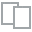
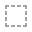
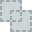
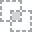
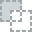
...
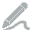
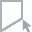
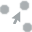
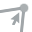
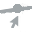

In [ ]:
plot(df_final)

In [ ]:
# Now lastly, let's select the columns we will use in the model.
cols_to_exclude = ['ID', 'Marital_Status']

df_model = df_final.drop(columns=cols_to_exclude)
df_model.columns

Index(['Education', 'Income', 'Kidhome', 'Teenhome', 'Dt_Customer', 'Recency',
       'Age', 'Lives_With_Someone', 'MntWines', 'MntFruits', 'MntMeatProducts',
       'MntFishProducts', 'MntSweetProducts', 'MntGoldProds', 'Total_Spent',
       'NumDealsPurchases', 'Accepted_Campaigns', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'Number_Purchases', 'Marital_Status_Divorced', 'Marital_Status_Married',
       'Marital_Status_Single', 'Marital_Status_Together',
       'Marital_Status_Widow'],
      dtype='object')

Ok, agora todas as colunas presentes no dataframe são numéricas, e serão escalonadas usando o StandardScaler

In [ ]:
scaler = StandardScaler()

scaler.fit(df_model)
df_scaled = pd.DataFrame(scaler.transform(df_model), columns= df_model.columns)

#Dimensionality reduction
We have a lot of features, and this can lead us to the "dimensionality reduction", where our samples become too sparse in the space. FOr this reason, we will use PCA to reduce the dimensionality.

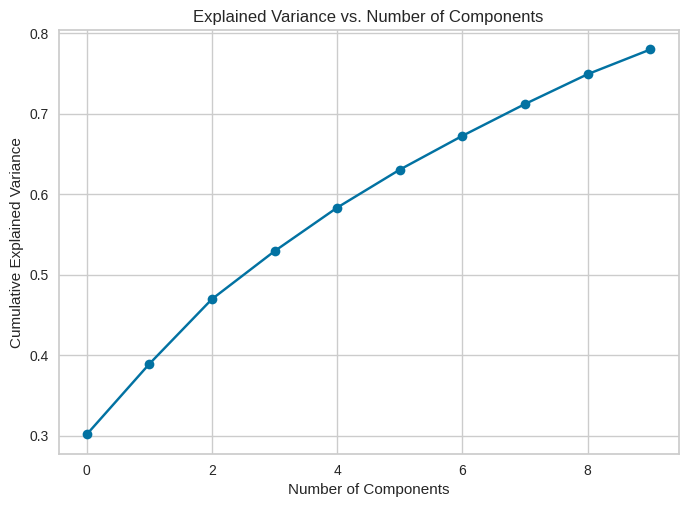

In [ ]:
pca = PCA(n_components=10)
df_pca = pca.fit_transform(df_scaled)

# Plotando a variância cumulativa do PCA
cumulative_variance = np.cumsum(pca.explained_variance_ratio_)
cumulative_variance

plt.plot(cumulative_variance, marker='o', linestyle='-', color='b')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Explained Variance vs. Number of Components')
plt.grid(True)
plt.show()

In [ ]:
pca = PCA(n_components=3)
df_pca = pca.fit_transform(df_scaled)

#Modeling

Since we don't have any business request or information, that is, we don't have a desired number of clusters or anything, we will use the "Elbow Method" to choose a number of clusters.

This method is based on de WCSS (Within Cluster Sum of Squares), that is, the sum of the squared distance from each point to the centroid of its cluster. Here, although we want a small WCSS, we will not choose the smallest, because we want the number when the graph stops to descrease rapidly and becomes more constant (which is "the elbow").

The Yellowbricks Library has a method that does this for us:

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

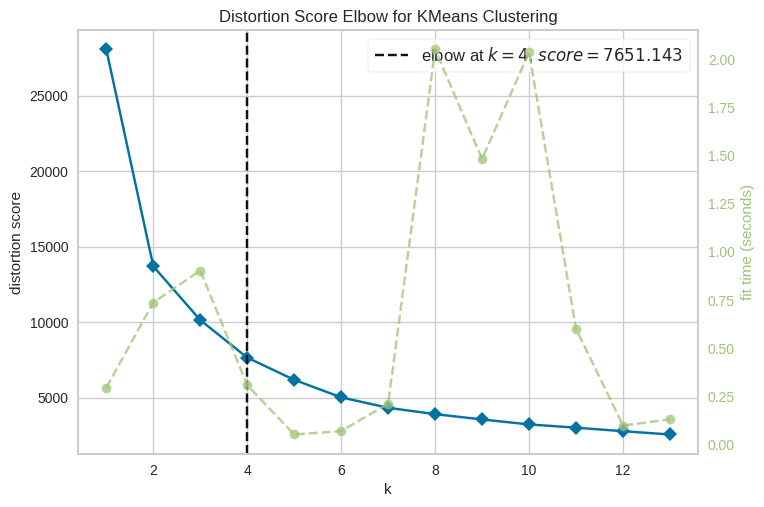

In [ ]:
visualizador = kelbow_visualizer(KMeans(random_state=42), df_pca, k=(1, 14))

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, make_scorer

def scorer(estimator, X, y=None):
    y_pred = estimator.fit_predict(X)
    return silhouette_score(X, y_pred)

model = KMeans()
param_grid = {
    'n_clusters': np.arange(2, 10),

}

gridCV = GridSearchCV(estimator = model,
                      param_grid=param_grid,
                      cv=2,
                      scoring=scorer)
gridCV.fit(df_scaled)
# Print the best parameters and best score
print("Best Parameters: ", gridCV.best_params_)
print("Best Silhouette Score: ", gridCV.best_score_)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

Best Parameters:  {'n_clusters': 2}
Best Silhouette Score:  0.22771995217819652


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

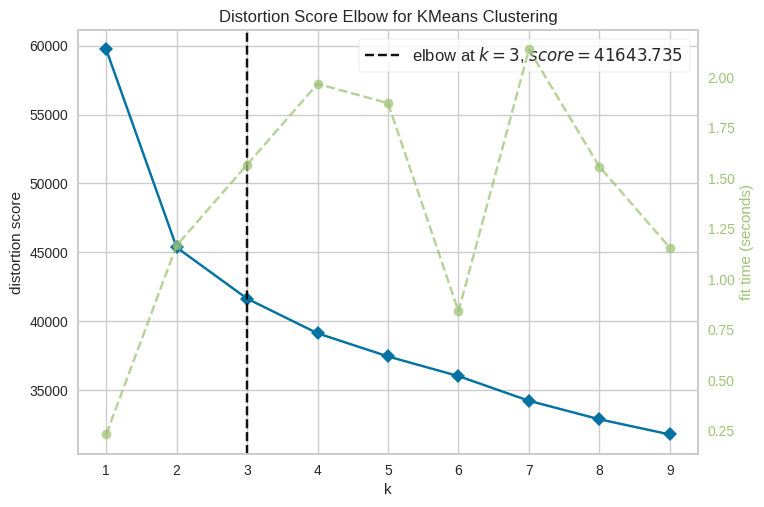

In [ ]:
visualizador = kelbow_visualizer(KMeans(random_state=42), df_scaled, k=(1, 10))

#PCA
Como a quantidade de colunas é expressiva frente ao número de dados, iremos utilizar o PCA para reduzir a dimensionalidade dos dados.

In [ ]:
pca = PCA(n_components=10)
df_pca = pca.fit_transform(df_scaled)

In [ ]:
df_pca

array([[ 4.45874119e+00,  2.11035057e+00,  7.15099312e-01, ...,
         4.56864859e-01,  5.35313256e-01, -2.56544800e-01],
       [-2.83311519e+00,  2.07040462e+00,  5.61716682e-01, ...,
        -5.90261023e-01, -9.94547845e-03,  1.34800059e+00],
       [ 2.01295658e+00, -8.01411230e-01, -6.34895141e-01, ...,
        -3.88804986e-03, -7.16017822e-01,  1.07880776e+00],
       ...,
       [ 1.81723045e+00,  1.92958945e+00,  2.62244011e-01, ...,
        -1.45892780e+00,  5.14862810e-02, -1.63474952e+00],
       [ 2.23759356e+00, -1.35062581e+00,  3.24800549e-01, ...,
         4.21202814e-01, -1.89288915e+00,  5.84493470e-01],
       [-1.86763800e+00, -1.73533492e+00,  9.58124355e-01, ...,
         9.66541089e-01, -2.02581230e-01, -9.85964223e-01]])

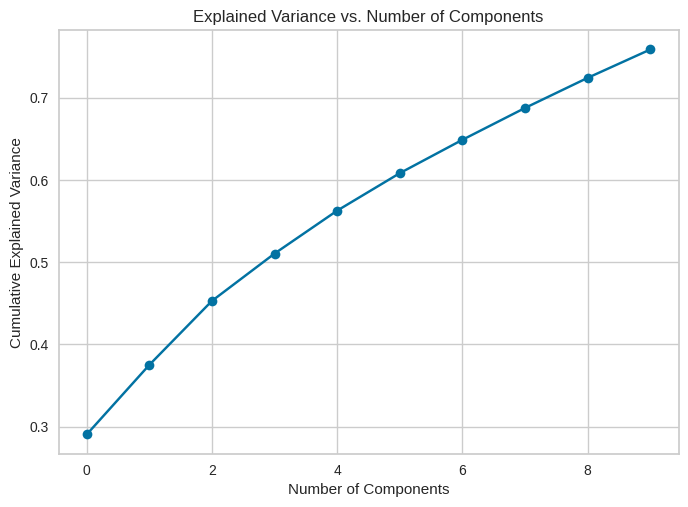

In [ ]:
pca = PCA(n_components=10)
df_pca = pca.fit_transform(df_scaled)
# Plotando a variância cumulativa do PCA
cumulative_variance = np.cumsum(pca.explained_variance_ratio_)
cumulative_variance

plt.plot(cumulative_variance, marker='o', linestyle='-', color='b')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Explained Variance vs. Number of Components')
plt.grid(True)
plt.show()

Para fins de facilitar a visualização, vamos utilizar 3 componentes.

In [ ]:
pca = PCA(n_components=3)
df_pca = pca.fit_transform(df_scaled)